# Lagrangian Analysis of CESM 0.1º CORE

In [2]:
%matplotlib inline
import xarray as xr
import numpy as np
import warnings
warnings.simplefilter("ignore") # Silence warnings
from tqdm import tqdm
# import bokeh

# Import ploting packages
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as mticker
import cmocean
import cmocean.plots
import proplot
from mpl_toolkits import mplot3d
import cartopy
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import sys
from utils import *
plt.rcParams['figure.facecolor']='white'
plt.rcParams['axes.facecolor']='white'

In [4]:
import dask
from dask_jobqueue import PBSCluster
from dask.distributed import Client

def CLSTR(N=1,T=15,M=109, P=10):
    nnodes = N; ntime="00:"+str(T)+":00"; nmemory= str(M)+"GB"; nprocesses= P
    cluster = PBSCluster(
        cores=nnodes, # The number of cores you want
        memory=nmemory, # Amount of memory
        processes=nprocesses, # How many processes
        walltime=ntime, # Amount of wall time
        queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
        local_directory='/glade/scratch/yeddebba/tmp', # Use your local directory
        resource_spec='select=1:ncpus='+str(P)+':mem='+nmemory, # Specify resources
        project='USIO0015', # Input your project ID here
        interface='ib0', # Interface to use
    )
#     cluster.scale(nnodes*nprocesses)
    cluster.scale(nnodes)
    dask.config.set({'distributed.dashboard.link':'https://jupyterhub.hpc.ucar.edu/stable/user/{USER}/proxy/{port}/status'})
    client = Client(cluster)
    
    return client

In [274]:
C=CLSTR(1,59,209,10)

In [321]:
C

Client Scheduler: tcp://10.12.206.54:36625 Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/38934/status,Cluster Workers: 10 Cores: 20 Memory: 209.00 GB


In [6]:
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/TEMP.0005-?[789012].nc'
dst = xr.open_mfdataset(path, )
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/O2.0005-?[789012].nc'
ds = xr.open_mfdataset(path, )
ds=xr.merge([ds,dst])

path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/UVEL.0005-?[789012].nc'
dsv = xr.open_mfdataset(path, )
ds=xr.merge([ds,dsv])

path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/PD.0005-?[789012].nc'
dsp = xr.open_mfdataset(path, )
ds=xr.merge([ds,dsp])
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/HMXL.0005-?[789012].nc'
dsh = xr.open_mfdataset(path, )
ds=xr.merge([ds,dsh])
dg = xr.open_dataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/POP_GRID_F.nc')#, decode_cf=False)
varname=['REGION_MASK']
dg=dg.drop([v for v in dg.variables if v not in varname])
ds=xr.merge([ds,dg])
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/budgets/STF_O2.0005-?[789012].nc'
dssh = xr.open_mfdataset(path, )
ds=xr.merge([ds,dssh])
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/SSH.0005-?[789012].nc'
dssh = xr.open_mfdataset(path, )
ds=xr.merge([ds,dssh])
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/SSH.0005-*.nc'
dsshm = xr.open_mfdataset(path, )
# SSH_M=(dsshm.SSH.isel(nlat=np.arange(300,400),nlon=np.arange(800,1200)).mean()).compute()
SSH_M=dsshm.SSH.mean('time').compute()
SSH_A=(ds.SSH-SSH_M).compute()
ds=add_grid(ds)
ds=ds.sel(time=slice('0005-07-01','0006-01-01',))
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/O2_rho_full.0005-?[789012].nc'
dst = xr.open_mfdataset(path, ).sel(time=slice('0005-07-01','0006-01-01',))
ds

<xarray.Dataset>
Dimensions:      (d2: 2, nlat: 631, nlon: 1701, time: 37, z_t: 41, z_w: 41, z_w_top: 41)
Coordinates:
    TLAT         (nlat, nlon) float64 -29.99 -29.99 -29.99 ... 30.03 30.03 30.03
    TLONG        (nlat, nlon) float64 120.1 120.2 120.2 ... 289.8 289.9 290.0
  * z_t          (z_t) float32 500.0 1500.0 2500.0 ... 98470.586 110620.42
  * time         (time) object 0005-07-05 00:00:00 ... 0006-01-01 00:00:00
    ULAT         (nlat, nlon) float64 -29.94 -29.94 -29.94 ... 30.07 30.07 30.07
    ULONG        (nlat, nlon) float64 120.1 120.2 120.3 ... -70.11 -70.01 -69.91
  * z_w          (z_w) float32 0.0 1000.0 2000.0 ... 92804.35 104136.82
  * z_w_top      (z_w_top) float32 0.0 1000.0 2000.0 ... 92804.35 104136.82
Dimensions without coordinates: d2, nlat, nlon
Data variables:
    O2           (time, z_t, nlat, nlon) float32 dask.array<chunksize=(6, 41, 631, 1701), meta=np.ndarray>
    time_bound   (time, d2) object dask.array<chunksize=(6, 2), meta=np.ndarray>
    TEMP         (time, z_t, nlat, nlon) float32 dask.array<chunksize=(6, 41, 631, 1701), meta=np.ndarray>
    UVEL         (time, z_t, nlat, nlon) float32 dask.array<chunksize=(6, 41, 631, 1701), meta=np.ndarray>
    PD           (time, z_t, nlat, nlon) float32 dask.array<chunksize=(6, 41, 631, 1701), meta=np.ndarray>
    HMXL         (time, nlat, nlon) float32 dask.array<chunksize=(6, 631, 1701), meta=np.ndarray>
    REGION_MASK  (nlat, nlon) float64 0.0 0.0 0.0 0.0 0.0 ... 6.0 6.0 6.0 6.0
    STF_O2       (time, nlat, nlon) float32 dask.array<chunksize=(6, 631, 1701), meta=np.ndarray>
    SSH          (time, nlat, nlon) float32 dask.array<chunksize=(6, 631, 1701), meta=np.ndarray>
    DZT          (z_t, nlat, nlon) float64 ...
    DZU          (z_t, nlat, nlon) float64 ...
    DXT          (nlat, nlon) float64 ...
    DXU          (nlat, nlon) float64 ...
    DYT          (nlat, nlon) float64 ...
    DYU          (nlat, nlon) float64 ...
    KMT          (nlat, nlon) float64 ...
    KMU          (nlat, nlon) float64 ...
    TAREA        (nlat, nlon) float64 ...
    UAREA        (nlat, nlon) float64 ...
    dz           (z_t) float32 ...
    dzw          (z_w) float32 ...

# Subduction Figure: Show particles seeded in SW corner of vortices

In [324]:
i=0; # day 1 
up=0; dp=100; 
SS=1;  NN=3; 
EE=131; WW=134;
pdl = 1.0245; pdu = 1.0235;

# file=[f'/glade/scr/yeddebba/PARCELS/parcels_fwd_yr_5.nc']
file=['/glade/scratch/yeddebba/PARCELS/LAGRANGIAN_BUDGET/LAGRANGIANT_BUDGET_BWD_05_07_10.nc']
pfile = xr.open_mfdataset(file[0])
pfile

ind=xr.where((pfile.pd[:,i]<=pdl)&(pfile.pd[:,i]>=pdu)&(pfile.lat[:,i]<=NN)&(pfile.lat[:,i]>=SS)&(((pfile.lon[:,i]-360<-EE)&(pfile.lon[:,i]-360>-WW))),1,0)
lonb = np.ma.filled(pfile.variables['lon'].where(ind==1), np.nan)
latb = np.ma.filled(pfile.variables['lat'].where(ind==1), np.nan)
zb=np.ma.filled(pfile.variables['z'].where(ind==1), np.nan)*1e-2
o2b=np.ma.filled(pfile['o2'].where(ind==1), np.nan)
wb=np.ma.filled(pfile['wvel'].where(ind==1), np.nan)
tempb=np.ma.filled(pfile['temperature'].where(ind==1), np.nan)
tend_o2b=np.ma.filled(pfile.variables['tend_o2'].where((ind==1)), np.nan)
j_o2b=np.ma.filled(pfile.variables['j_o2'].where((ind==1)), np.nan)
mix_o2b=np.ma.filled(pfile.variables['mix_o2'].where((ind==1)), np.nan)
hmix_o2b=np.ma.filled(pfile.variables['hmix_o2'].where((ind==1)), np.nan)
adv_o2b=np.ma.filled(pfile.variables['adv_o2'].where((ind==1)), np.nan)
tw=pfile.time[0,:].compute()

file=['/glade/scratch/yeddebba/PARCELS/LAGRANGIAN_BUDGET/CESM_LAGRANGIAN_BUDGET_FWD_05_10_12.nc']
pfile = xr.open_mfdataset(file[0])
pfile
ind=xr.where((pfile.pd[:,i]<=pdl)&(pfile.pd[:,i]>=pdu)&(pfile.lat[:,i]<=NN)&(pfile.lat[:,i]>=SS)&(((pfile.lon[:,i]-360<-EE)&(pfile.lon[:,i]-360>-WW))),1,0)
lon = np.ma.filled(pfile.variables['lon'].where((ind==1)), np.nan)
lat = np.ma.filled(pfile.variables['lat'].where((ind==1)), np.nan)
z=np.ma.filled(pfile.variables['z'].where((ind==1)), np.nan)*1e-2
o2=np.ma.filled(pfile.variables['o2'].where((ind==1)), np.nan)
tend_o2=np.ma.filled(pfile.variables['tend_o2'].where((ind==1)), np.nan)
j_o2=np.ma.filled(pfile.variables['j_o2'].where((ind==1)), np.nan)
mix_o2=np.ma.filled(pfile.variables['mix_o2'].where((ind==1)), np.nan)
hmix_o2=np.ma.filled(pfile.variables['hmix_o2'].where((ind==1)), np.nan)
adv_o2=np.ma.filled(pfile.variables['adv_o2'].where((ind==1)), np.nan)
w=np.ma.filled(pfile['wvel'].where(ind==1), np.nan)
temp=np.ma.filled(pfile['temperature'].where(ind==1), np.nan)
tf=pfile.time[0,:].compute()

o2n=o2[~np.isnan(o2[:,0]),1:91:1];
o2nb=o2b[~np.isnan(o2b[:,0]),91::-1];
o2ts=np.concatenate([np.nanmean(o2nb,0),np.nanmean(o2n,0)],axis=0)
o2tsu=np.concatenate([np.nanpercentile(o2nb,25,axis=0),np.nanpercentile(o2n,25,axis=0)],axis=0)
o2tsl=np.concatenate([np.nanpercentile(o2nb,75,axis=0),np.nanpercentile(o2n,75,axis=0)],axis=0)

tend_o2n=tend_o2[~np.isnan(tend_o2[:,0]),1:91:1];
tend_o2nb=tend_o2b[~np.isnan(tend_o2b[:,0]),91::-1];
# tend_o2ts=np.concatenate([tend_o2nb,tend_o2n],axis=1)
tend_o2ts=np.concatenate([np.nanmean(tend_o2nb,0),np.nanmean(tend_o2n,0)],axis=0)
tend_o2tsu=np.concatenate([np.nanpercentile(tend_o2nb,25,axis=0),np.nanpercentile(tend_o2n,25,axis=0)],axis=0)
tend_o2tsl=np.concatenate([np.nanpercentile(tend_o2nb,75,axis=0),np.nanpercentile(tend_o2n,75,axis=0)],axis=0)

mix_o2n=mix_o2[~np.isnan(mix_o2[:,0]),1:91:1];
mix_o2nb=mix_o2b[~np.isnan(mix_o2b[:,0]),91::-1];
# mix_o2ts=np.concatenate([mix_o2nb,mix_o2n],axis=1)
mix_o2ts=np.concatenate([np.nanmean(mix_o2nb,0),np.nanmean(mix_o2n,0)],axis=0)
mix_o2tsu=np.concatenate([np.nanpercentile(mix_o2nb,25,axis=0),np.nanpercentile(mix_o2n,25,axis=0)],axis=0)
mix_o2tsl=np.concatenate([np.nanpercentile(mix_o2nb,75,axis=0),np.nanpercentile(mix_o2n,75,axis=0)],axis=0)

hmix_o2n=hmix_o2[~np.isnan(hmix_o2[:,0]),1:91:1];
hmix_o2nb=hmix_o2b[~np.isnan(hmix_o2b[:,0]),91::-1];
# hmix_o2ts=np.concatenate([hmix_o2nb,hmix_o2n],axis=1)
hmix_o2ts=np.concatenate([np.nanmean(hmix_o2nb,0),np.nanmean(hmix_o2n,0)],axis=0)
hmix_o2tsu=np.concatenate([np.nanpercentile(hmix_o2nb,25,axis=0),np.nanpercentile(hmix_o2n,25,axis=0)],axis=0)
hmix_o2tsl=np.concatenate([np.nanpercentile(hmix_o2nb,75,axis=0),np.nanpercentile(hmix_o2n,75,axis=0)],axis=0)

j_o2n=j_o2[~np.isnan(j_o2[:,0]),1:91:1];
j_o2nb=j_o2b[~np.isnan(j_o2b[:,0]),91::-1];
# j_o2ts=np.concatenate([j_o2nb,j_o2n],axis=1)
j_o2ts=np.concatenate([np.nanmean(j_o2nb,0),np.nanmean(j_o2n,0)],axis=0)
j_o2tsu=np.concatenate([np.nanpercentile(j_o2nb,25,axis=0),np.nanpercentile(j_o2n,25,axis=0)],axis=0)
j_o2tsl=np.concatenate([np.nanpercentile(j_o2nb,75,axis=0),np.nanpercentile(j_o2n,75,axis=0)],axis=0)

adv_o2n=adv_o2[~np.isnan(adv_o2[:,0]),1:91:1];
adv_o2nb=adv_o2b[~np.isnan(adv_o2b[:,0]),91::-1];
# adv_o2ts=np.concatenate([adv_o2nb,adv_o2n],axis=1)
adv_o2ts=np.concatenate([np.nanmean(adv_o2nb,0),np.nanmean(adv_o2n,0)],axis=0)
adv_o2tsu=np.concatenate([np.nanpercentile(adv_o2nb,25,axis=0),np.nanpercentile(adv_o2n,25,axis=0)],axis=0)
adv_o2tsl=np.concatenate([np.nanpercentile(adv_o2nb,75,axis=0),np.nanpercentile(adv_o2n,75,axis=0)],axis=0)

zn=z[~np.isnan(z[:,0]),1:91:1];
znb=zb[~np.isnan(zb[:,0]),91::-1];
#zts=np.concatenate([znb,zn],axis=1)
zts=np.concatenate([np.nanmean(znb,0),np.nanmean(zn,0)],axis=0)
ztsu=np.concatenate([np.nanpercentile(znb,25,axis=0),np.nanpercentile(zn,25,axis=0)],axis=0)
ztsl=np.concatenate([np.nanpercentile(znb,75,axis=0),np.nanpercentile(zn,75,axis=0)],axis=0)

latn=lat[~np.isnan(lat[:,0]),1:91:1];
latnb=latb[~np.isnan(latb[:,0]),91::-1];
# latts=np.concatenate([latnb,latn],axis=1)
latts=np.concatenate([np.nanmean(latnb,0),np.nanmean(latn,0)],axis=0)
lattsu=np.concatenate([np.nanpercentile(latnb,25,axis=0),np.nanpercentile(latn,25,axis=0)],axis=0)
lattsl=np.concatenate([np.nanpercentile(latnb,75,axis=0),np.nanpercentile(latn,75,axis=0)],axis=0)

# lonn=lon[~np.isnan(lon[:,0]),1:91:1];
# lonnb=lonb[~np.isnan(lonb[:,0]),91::-1];
# lonts=np.concatenate([lonnb,lonn],axis=1)

# wn=w[~np.isnan(w[:,0]),1:91:1];
# wnb=wb[~np.isnan(wb[:,0]),91::-1];
# wts=np.concatenate([wnb,wn],axis=1)*1e-2*60*60*24

# tempn=temp[~np.isnan(temp[:,0]),1:91:1];
# tempnb=tempb[~np.isnan(tempb[:,0]),91::-1];
# tempts=np.concatenate([tempnb,tempn],axis=1)

ptime=np.concatenate([tw[91::-1],tf[1:91:1]])
pdays=np.arange(-18*5,19*5,5)

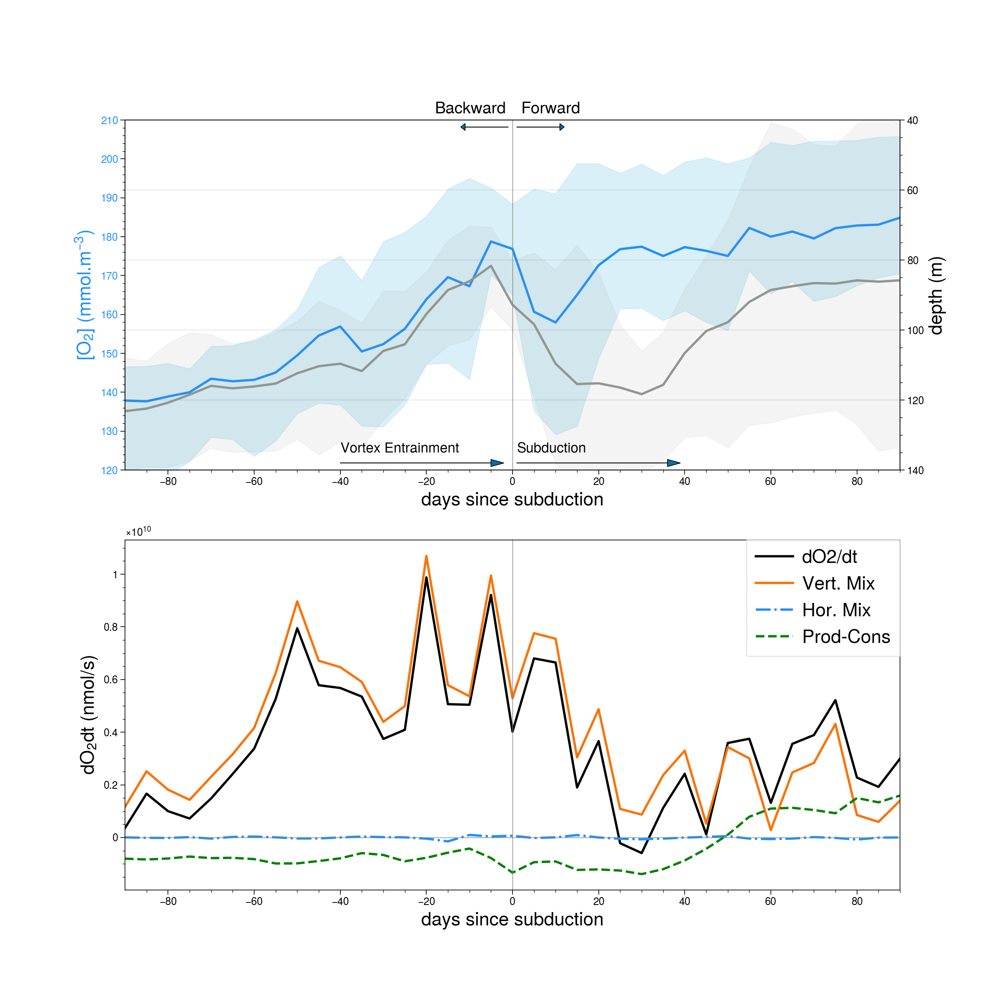

In [325]:
fig=plt.figure(figsize=(12,12)); 
ax=plt.subplot(2,1,1)
ax.plot(pdays,o2ts,lw=2.0,color='dodgerblue');

ax.fill_between(pdays,o2tsl,o2tsu,
                         facecolor="dodgerblue", # The fill color
                         color='skyblue',       # The outline color
                         alpha=0.3)
plt.ylim(120,210)
plt.ylabel('[O$_2$] (mmol.m$^{-3}$)',color='dodgerblue',fontsize=16)
plt.yticks(color='dodgerblue')
plt.xlabel('days since subduction',fontsize=16)
ax.grid(False)

ax2=ax.twinx()
ax2.plot(pdays,zts,lw=2.0,color='gray');
ax2.fill_between(pdays,ztsl,ztsu,
                         facecolor="green", # The fill color
                         color='gray',alpha=0.1)       # The outline color
plt.ylim(140,40)
plt.ylabel('depth (m)',color='black',fontsize=16)
plt.yticks(color='black')
plt.xlim(-90,90)
plt.axvline(x=0,color='grey',lw=0.5)
plt.text(1,135,'Subduction',rotation=0,fontsize=12)
plt.arrow(1,138,35,0,head_width=2,head_length=3)
plt.text(-40,135,'Vortex Entrainment', rotation=0,fontsize=12)
plt.arrow(-40,138,35,0,head_width=2,head_length=3)

plt.text(2,38,'Forward',rotation=0,fontsize=14)
plt.arrow(1,42,10,0,head_width=2,head_length=1)
plt.text(-18,38,'Backward',rotation=0,fontsize=14)
plt.arrow(-1,42,-10,0,head_width=2,head_length=1)


ax=plt.subplot(2,1,2)
ax.plot(pdays,tend_o2ts-adv_o2ts,lw=2.0,color='black',label='dO2/dt');
# ax.plot(pdays,tend_o2ts,lw=2.0,color='blue');
ax.plot(pdays,mix_o2ts,lw=2.0,color='orange',label='Vert. Mix');
ax.plot(pdays,hmix_o2ts,lw=2.0,color='dodgerblue',label='Hor. Mix',ls='-.');
ax.plot(pdays,j_o2ts,lw=2.0,color='green',label='Prod-Cons',ls='--');
# ax.plot(pdays,j_o2ts+mix_o2ts+hmix_o2ts,lw=2.0,color='gray',ls='-.');
# ax.plot(pdays,tend_o2ts,lw=2.0,color='blue');
plt.axvline(x=0,color='grey',lw=0.5)

# plt.ylim(120,210)
plt.ylabel('dO$_2$dt (nmol/s)',color='black',fontsize=16)
plt.yticks(color='black')
plt.xlabel('days since subduction',fontsize=16)
plt.legend(fontsize=16)
ax.grid(False)
plt.xlim(-90,90)
plt.axhline(y=0,color='grey',lw=0.5)

100%|██████████| 5/5 [00:11<00:00,  2.29s/it]


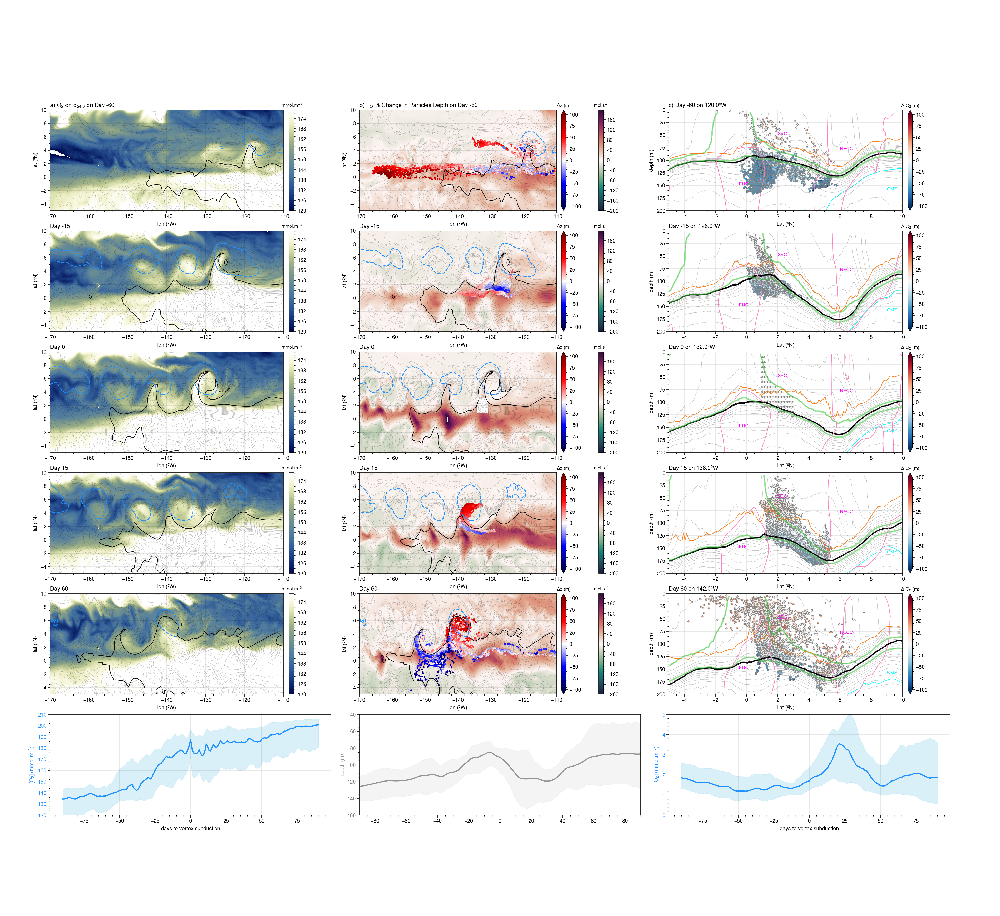

In [55]:
fig = plt.figure(figsize=(24,22),dpi=100, facecolor='white')
gs = fig.add_gridspec(nrows=6, ncols=3, left=0.05, right=0.95, wspace=0.1, hspace=0.2)
fs=8; fsx=6

lon_v=[-120.0,-126.0,-132.0,-138.0,-142.0]; lat_v=5.0 ; d_z=15
zz= ds.z_t*1e-2
E=-170; W=-110; S=-5; N=10; DN=200; UP=0
ii=0
d1=60; d2=15; d3=15; d4=60
rng=[90-d1,90-d2,90,90+d3,90+d4];
md=90
rho=1.0240

ii=0    
for i in tqdm(rng): 
    ax = fig.add_subplot(gs[int(ii),0])
    ax=plt.contourf(ds.TLONG-360,ds.TLAT, dst.O2.sel(time=ptime[i]).sel(PD=rho),np.arange(120, 180, 1),cmap='davos')
    cb = plt.colorbar(ax,orientation='vertical', extend='both',pad=0.02, aspect=20)
    cb.ax.set_title(r'mmol.m$^{-3}$',fontsize=fs)
    plt.contour(ds.TLONG-360,ds.TLAT, ds.TEMP.sel(time=ptime[i]).isel(z_t=0), colors='black', linestyle='solid', linewidths=0.3, alpha=0.3, levels=np.arange(21,29.1, 0.2))
    plt.contour(ds.TLONG-360,ds.TLAT, ds.TEMP.sel(time=ptime[i]).isel(z_t=0), colors='black', linestyle='solid', linewidths=1.0, alpha=0.95, levels=np.arange(26,26.1, 0.2))
    plt.contour(ds.TLONG-360,ds.TLAT, SSH_A.sel(time=ptime[i]), colors='dodgerblue', linestyles='dashed', linewidths=1.5, levels=np.arange(10,10.1, 0.1))
    plt.xlabel('lon (ºE)')
    plt.xlim(E,W)
    plt.ylim(S,N)
    plt.xlabel('lon (ºW)')
    plt.ylabel('lat (ºN)')
    if ii==0: plt.title(r'a) O$_2$ on $\sigma_{'+str(round((rho-1.0)*1e3,1))+'}$ on Day '+str(i-md),loc='left')
    if ii>=1: plt.title('Day '+str(i-90),loc='left')
    ii+=1   
#     plt.arrow(-135, 8.5, -3, 0, length_includes_head=False, width= 0.2, head_width=1, head_length=1,color='dodgerblue',alpha=1.0)
#     plt.text(-140, 9.0, 'Vortex Propagation', rotation=0, color='dodgerblue', fontsize = 11)

ii=0    
for i in tqdm(rng): 
    ax = fig.add_subplot(gs[int(ii),1])
    ax=plt.contourf(ds.TLONG-360,ds.TLAT, ds.STF_O2.sel(time=ptime[i])*ds.TAREA*nmol_mol,np.arange(-200, 200, 1),cmap='curl')
    cb = plt.colorbar(ax,orientation='vertical', extend='both',pad=0.005, aspect=20)
    cb.ax.set_title(r'mol.s$^{-1}$',fontsize=fs)
    plt.contour(ds.TLONG-360,ds.TLAT, ds.TEMP.sel(time=ptime[i]).isel(z_t=0), colors='black', linestyle='solid', linewidths=0.3, alpha=0.3, levels=np.arange(21,29.1, 0.2))
    plt.contour(ds.TLONG-360,ds.TLAT, ds.TEMP.sel(time=ptime[i]).isel(z_t=0), colors='black', linestyle='solid', linewidths=1.0, alpha=0.95, levels=np.arange(26,26.1, 0.2))
    ax=plt.scatter(np.transpose(lonts[:,i]-360),np.transpose(latts[:,i]), c=np.transpose(zts[:,i]-zts[:,md]), cmap='seismic', vmin=-100, vmax=100, marker='o', s=5.0,alpha=1.0)
    cb2 = plt.colorbar(ax,orientation='vertical', extend='both',pad=0.02, aspect=20)
    cb2.ax.set_title(r'$\Delta$z (m)',fontsize=fs)
    plt.contour(ds.TLONG-360,ds.TLAT, SSH_A.sel(time=ptime[i]), colors='dodgerblue', linestyles='dashed', linewidths=1.5, levels=np.arange(10,10.1, 0.1))
    plt.xlabel('lon (ºE)')
    plt.xlim(E,W)
    plt.ylim(S,N)
    plt.xlabel('lon (ºW)')
    plt.ylabel('lat (ºN)')
    if ii==0: plt.title(r'b) F$_{O_2}$ & Change in Particles Depth on Day '+str(i-md),loc='left')
    if ii>=1: plt.title('Day '+str(i-90),loc='left')
    ii+=1   
#     plt.arrow(-135, 8.5, -3, 0, length_includes_head=False, width= 0.2, head_width=1, head_length=1,color='dodgerblue',alpha=1.0)
#     plt.text(-140, 9.0, 'Vortex Propagation', rotation=0, color='dodgerblue', fontsize = 11)

k=0
ii=0
for i in tqdm(rng): 
    j=i
    lats,lons=find_indices(ds.TLONG,ds.TLAT,360+lon_v[ii],lat_v)
    x=ds.TLONG[lats,:]-360. ;y=ds.TLAT[:,lons] ; 
    ax = fig.add_subplot(gs[int(ii),2])
    ax = plt.scatter(np.transpose(latts[:,j]), np.transpose(zts[:,j]), c=np.transpose(o2ts[:,i]-o2ts[:,md]), cmap='RdBu_r', vmin=-100, vmax=100, marker='o', s=10.0,alpha=1.0,edgecolors='grey') #
    if i==0: plt.scatter(np.transpose(latts[:,0]), np.transpose(z[:,0]), marker='.',color='grey',s=2.0,alpha=1.0)
    plt.ylim(DN,UP)
    plt.xlim(S,N)
    plt.xlabel('Lat (ºN)')
    cb = plt.colorbar(ax,orientation='vertical', extend='both',pad=0.02, aspect=20)
    cb.ax.set_title(r'$\Delta$ O$_2$ (m)',fontsize=fs)
    plt.ylabel('depth (m)')
    if ii==0: plt.title('c) Day '+str(j-md)+' on '+str(abs(lon_v[ii]))+'ºW',loc='left')
    if ii>=1: plt.title('Day '+str(j-md)+' on '+str(abs(lon_v[ii]))+'ºW',loc='left')            
    plt.contour(ds.TLAT[:,lons],zz, ds.O2.sel(time=ptime[i]).isel(nlon=lons),np.arange(60.0, 60.11, 0.1),colors='cyan',linewidths=0.7,alpha=1.0)
    plt.contour(ds.TLAT[:,lons],zz, ds.TEMP.sel(time=ptime[i]).isel(nlon=lons),np.arange(21.0, 21.11, 0.1),colors='black',linewidths=1.8,alpha=1.0)
    plt.contour(ds.TLAT[:,lons],zz, ds.PD.sel(time=ptime[i]).isel(nlon=lons),np.arange(1.0221, 1.0271, 0.0002),colors='grey',linewidths=0.5,alpha=0.5)
    plt.contour(ds.TLAT[:,lons],zz, ds.PD.sel(time=ptime[i]).isel(nlon=lons),np.arange(1.0235, 1.02351, 0.01),colors='limegreen',linewidths=2.5,alpha=0.5)
    plt.contour(ds.TLAT[:,lons],zz, ds.PD.sel(time=ptime[i]).isel(nlon=lons),np.arange(1.0245, 1.02451, 0.01),colors='limegreen',linewidths=2.5,alpha=0.5)
    plt.plot(ds.TLAT[:,lons],ds.HMXL.sel(time=ptime[i]).isel(nlon=lons)*1e-2,color='orange',linewidth=1.0,alpha=0.9)
    plt.contour(ds.TLAT[:,lons],zz, ds.UVEL.sel(time=ptime[i]).isel(nlon=lons),np.arange(10.0, 10.1, 0.1),colors='pink',linewidths=1.0,alpha=1.0)
    plt.text(-0.5, 150, 'EUC', {'color': 'magenta', 'fontsize': fs})
    plt.text(2, 50, 'SEC', {'color': 'magenta', 'fontsize': fs})
    plt.text(6, 80, 'NECC', {'color': 'magenta', 'fontsize': fs})
    plt.text(9, 160, 'OMZ', {'color': 'cyan', 'fontsize': fs})

    ii+=1

    
ax = fig.add_subplot(gs[int(ii),0])
???
    
ax2 = fig.add_subplot(gs[int(ii),1])
# ax2=ax.twinx()
ax2.plot(np.arange(0-90,np.size(zts[0,:])-90),np.nanmean(zts,axis=0),lw=2.0,color='gray');
ax2.fill_between(np.arange(0-90,np.size(zts[0,:])-90),np.percentile(zts,25,axis=0),np.percentile(zts,75,axis=0),
                         facecolor="green", # The fill color
                         color='gray',       # The outline color
                         alpha=0.1)
plt.ylim(160,40)
plt.ylabel('depth (m)',color='gray')
plt.grid(False)
plt.yticks(color='grey')
plt.xlim(-90,90)
plt.axvline(x=0,color='grey',lw=0.5)    
    
ax = fig.add_subplot(gs[int(ii),2])
ax.plot(np.arange(0-90,np.size(o2ts[0,:])-90),np.nanmedian(o2ts,axis=0),lw=2.0,color='dodgerblue');
ax.fill_between(np.arange(0-90,np.size(o2ts[0,:])-90),np.percentile(o2ts, 25,axis=0),np.percentile(o2ts, 75,axis=0),
                         facecolor="dodgerblue", # The fill color
                         color='skyblue',       # The outline color
                         alpha=0.3)
plt.ylim(120,210)
plt.ylabel('[O$_2$] (mmol.m$^{-3}$)',color='dodgerblue')
plt.yticks(color='dodgerblue')
plt.xlabel('days to vortex subduction')


    
plt.tight_layout()